In [1]:
import folium
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)

In [3]:
#Load the data
df = pd.read_excel(r'C:\Users\gixi_\Downloads\Final Project - Airbnb Pricing/arr_df.xlsx')
df.head(5)

,Unnamed: 0,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Accommodation_Type,Star,labels,price_group,Final_Arrondissement,address
0,3,21 Tour Eiffel Appartement pour 2 personnes,48.84118,2.30754,2,90,Entire Place,5.0,9,2,15,"Traiteur Rose, Rue de Vaugirard, Quartier Neck..."
1,4,Appartement 2 pièces calme et spacieux,48.82545,2.31876,2,90,Entire Place,5.0,9,2,14,"Jean Moulin, Rue des Plantes, Quartier de Plai..."
2,5,Paris: Agréable petit studio à côté de la gare,48.84180,2.32222,2,90,Entire Place,5.0,9,2,15,"Monoprix, Rue du Départ, Quartier Necker, Pari..."
3,7,Charming studio near Montparnasse train station,48.83071,2.31601,2,90,Entire Place,5.0,9,2,14,"Villa Léone, Quartier de Plaisance, Paris 14e ..."
4,8,Lumineux Appartement Rénové,48.83244,2.32847,2,90,Entire Place,5.0,9,2,14,"41 P, Rue Boulard, Quartier du Petit-Montrouge..."


In [4]:
#Double check all the columns
df.columns

Index(['Unnamed: 0', 'Name', 'Lat', 'Lon', 'Numer_of_Guests',
       'Price_per_night', 'Accommodation_Type', 'Star', 'labels',
       'price_group', 'Final_Arrondissement', 'address'],
      dtype='object')

In [5]:
#Assign the neccessary columns
airbnb = df[['Name','Lat','Lon','Numer_of_Guests','Price_per_night','Accommodation_Type','Star','Final_Arrondissement']]
airbnb

,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Accommodation_Type,Star,Final_Arrondissement
0,21 Tour Eiffel Appartement pour 2 personnes,48.84118,2.30754,2,90,Entire Place,5.0,15
1,Appartement 2 pièces calme et spacieux,48.82545,2.31876,2,90,Entire Place,5.0,14
2,Paris: Agréable petit studio à côté de la gare,48.84180,2.32222,2,90,Entire Place,5.0,15
3,Charming studio near Montparnasse train station,48.83071,2.31601,2,90,Entire Place,5.0,14
4,Lumineux Appartement Rénové,48.83244,2.32847,2,90,Entire Place,5.0,14
...,...,...,...,...,...,...,...,...
9655,Cosy Studio - Parc des expositions / Tour Eiff...,48.83634,2.27718,2,84,Entire Place,2.5,15
9656,Madeleine Area Charming & Stylish Studio,48.87046,2.32238,3,127,Entire Place,2.0,8
9657,Opéra 2,48.87365,2.33423,6,150,Entire Place,3.0,9
9658,Sweet Inn | Charming 1BR Apt. in Saint Lazare,48.87985,2.32840,3,156,Entire Place,3.0,8


In [6]:
#Check the null data in all columns as well as the data types
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9660 entries, 0 to 9659
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Name                  9659 non-null   object 
 1   Lat                   9660 non-null   float64
 2   Lon                   9660 non-null   float64
 3   Numer_of_Guests       9660 non-null   int64  
 4   Price_per_night       9660 non-null   int64  
 5   Accommodation_Type    9660 non-null   object 
 6   Star                  9660 non-null   float64
 7   Final_Arrondissement  9660 non-null   int64  
dtypes: float64(3), int64(3), object(2)
memory usage: 603.9+ KB


In [7]:
#Remove all null row
airbnb.dropna(how='any', inplace = True)
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9659 entries, 0 to 9659
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Name                  9659 non-null   object 
 1   Lat                   9659 non-null   float64
 2   Lon                   9659 non-null   float64
 3   Numer_of_Guests       9659 non-null   int64  
 4   Price_per_night       9659 non-null   int64  
 5   Accommodation_Type    9659 non-null   object 
 6   Star                  9659 non-null   float64
 7   Final_Arrondissement  9659 non-null   int64  
dtypes: float64(3), int64(3), object(2)
memory usage: 679.1+ KB


<ipython-input-7-54967d4c157d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airbnb.dropna(how='any', inplace = True)


In [8]:
#Plot all the labels on the map
import matplotlib.colors as colors
locations = airbnb[['Lat','Lon','Final_Arrondissement']]
map = folium.Map(location=[locations.Lat.mean(), locations.Lon.mean()], zoom_start=11, control_scale=True)

x = np.arange(20)
ys = [i + x + (i*x)**2 for i in range(20)]
colors_array = cm.gnuplot(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

for lat, lng, cluster in zip(locations['Lat'], locations['Lon'],  locations['Final_Arrondissement']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(map)
    

In [9]:
map

In [10]:
#Print the updated dataset
airbnb

,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Accommodation_Type,Star,Final_Arrondissement
0,21 Tour Eiffel Appartement pour 2 personnes,48.84118,2.30754,2,90,Entire Place,5.0,15
1,Appartement 2 pièces calme et spacieux,48.82545,2.31876,2,90,Entire Place,5.0,14
2,Paris: Agréable petit studio à côté de la gare,48.84180,2.32222,2,90,Entire Place,5.0,15
3,Charming studio near Montparnasse train station,48.83071,2.31601,2,90,Entire Place,5.0,14
4,Lumineux Appartement Rénové,48.83244,2.32847,2,90,Entire Place,5.0,14
...,...,...,...,...,...,...,...,...
9655,Cosy Studio - Parc des expositions / Tour Eiff...,48.83634,2.27718,2,84,Entire Place,2.5,15
9656,Madeleine Area Charming & Stylish Studio,48.87046,2.32238,3,127,Entire Place,2.0,8
9657,Opéra 2,48.87365,2.33423,6,150,Entire Place,3.0,9
9658,Sweet Inn | Charming 1BR Apt. in Saint Lazare,48.87985,2.32840,3,156,Entire Place,3.0,8


<AxesSubplot:>

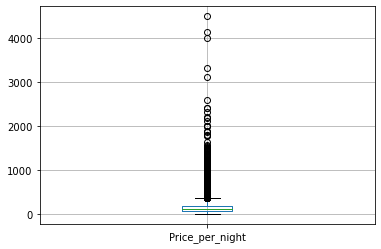

In [11]:
#Plot the price per night to check the outliers
airbnb.boxplot('Price_per_night')

In [12]:
#Remove the price outliers
airbnb.drop(airbnb[airbnb['Price_per_night'] > 5000].index, inplace=True)

C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


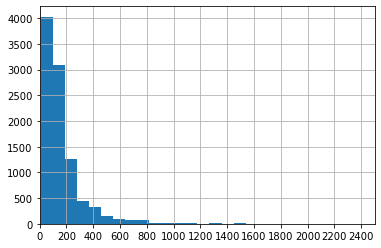

In [13]:
#Plot the price_per_night as histogram
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.pyplot import figure
fig, ax = plt.subplots()
airbnb["Price_per_night"].hist(bins=50)
plt.xlim(xmax=2500)
plt.xlim(xmin=0)
ax.set_xticks([0,200,400,600,800,1000,1200,1400,1600,1800,2000,2200,2400])

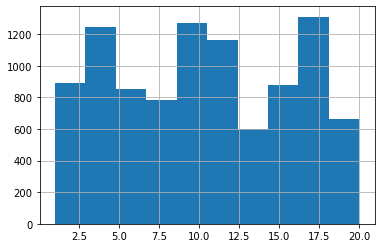

In [14]:
#Create a histogram for labels
fig, ax = plt.subplots()
airbnb["Final_Arrondissement"].hist()
plt.show()


In [15]:
#Create bins for prices per night
bins = [0, 50, 100, 300, np.inf]
labels = [1,2,3,4]
airbnb['price_group'] = pd.cut(airbnb["Price_per_night"],bins=bins, labels=labels)


<ipython-input-15-d2e07980b9be>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airbnb['price_group'] = pd.cut(airbnb["Price_per_night"],bins=bins, labels=labels)


In [16]:
#Print the price_group which will be considered for target variable for the later models
airbnb['price_group']

0       2
1       2
2       2
3       2
4       2
       ..
9655    2
9656    3
9657    3
9658    3
9659    2
Name: price_group, Length: 9659, dtype: category
Categories (4, int64): [1 < 2 < 3 < 4]

In [17]:
#Check value counts for all labels
airbnb.groupby('price_group')[['Name']].agg('count')

,Name
price_group,
1,713
2,3316
3,4497
4,1133


In [18]:
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Entire') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('hotel') == True] = 'Hotel Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Shared') == True] = 'Shared Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Private') == True] = 'Private Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Hotel') == True] = 'Hotel Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Tiny') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Boat') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Tower') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'] == 'Room in serviced apartment'] = 'Private Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'] == 'Room in bed and breakfast'] = 'Private Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'] == 'Room in hostel'] = 'Hotel Rooms'

C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

In [50]:
#Plot all the labels on the map
import matplotlib.colors as colors
locations = airbnb[['Lat','Lon','price_group']]
map1 = folium.Map(location=[locations.Lat.mean(), locations.Lon.mean()], zoom_start=11, control_scale=True)

x = np.arange(4)
ys = [i + x + (i*x)**2 for i in range(4)]
colors_array1 = cm.gnuplot(np.linspace(0, 1, len(ys)))
rainbow1 = [colors.rgb2hex(i) for i in colors_array1]

for lat, lng, cluster in zip(locations['Lat'], locations['Lon'],  locations['price_group']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow1[cluster-1],
        fill_opacity=0.9).add_to(map1)
    
map1

In [51]:
rainbow1
#black,purple,orange,yellow

['#000000', '#9309dd', '#d04c00', '#ffff00']

In [21]:
airbnb.drop('Star', axis = 1, inplace = True)

C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [22]:
airbnb['Accommodation_Type'].unique()

array(['Entire Place', 'Private Rooms', 'Hotel Rooms', 'Shared Rooms'],
      dtype=object)

<AxesSubplot:>

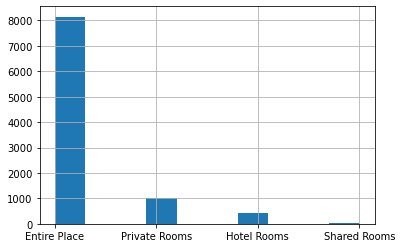

In [23]:
airbnb["Accommodation_Type"].hist()

In [24]:
airbnb_dummies = pd.get_dummies(airbnb, columns=['Accommodation_Type'])
airbnb_dummies


,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Final_Arrondissement,price_group,Accommodation_Type_Entire Place,Accommodation_Type_Hotel Rooms,Accommodation_Type_Private Rooms,Accommodation_Type_Shared Rooms
0,21 Tour Eiffel Appartement pour 2 personnes,48.84118,2.30754,2,90,15,2,1,0,0,0
1,Appartement 2 pièces calme et spacieux,48.82545,2.31876,2,90,14,2,1,0,0,0
2,Paris: Agréable petit studio à côté de la gare,48.84180,2.32222,2,90,15,2,1,0,0,0
3,Charming studio near Montparnasse train station,48.83071,2.31601,2,90,14,2,1,0,0,0
4,Lumineux Appartement Rénové,48.83244,2.32847,2,90,14,2,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
9655,Cosy Studio - Parc des expositions / Tour Eiff...,48.83634,2.27718,2,84,15,2,1,0,0,0
9656,Madeleine Area Charming & Stylish Studio,48.87046,2.32238,3,127,8,3,1,0,0,0
9657,Opéra 2,48.87365,2.33423,6,150,9,3,1,0,0,0
9658,Sweet Inn | Charming 1BR Apt. in Saint Lazare,48.87985,2.32840,3,156,8,3,1,0,0,0


In [25]:
airbnb_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9659 entries, 0 to 9659
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   Name                              9659 non-null   object  
 1   Lat                               9659 non-null   float64 
 2   Lon                               9659 non-null   float64 
 3   Numer_of_Guests                   9659 non-null   int64   
 4   Price_per_night                   9659 non-null   int64   
 5   Final_Arrondissement              9659 non-null   int64   
 6   price_group                       9659 non-null   category
 7   Accommodation_Type_Entire Place   9659 non-null   uint8   
 8   Accommodation_Type_Hotel Rooms    9659 non-null   uint8   
 9   Accommodation_Type_Private Rooms  9659 non-null   uint8   
 10  Accommodation_Type_Shared Rooms   9659 non-null   uint8   
dtypes: category(1), float64(2), int64(3), object(1), uint8(4

In [26]:
airbnb_dummies.drop(['Name','Price_per_night','Lat','Lon'], axis = 1, inplace = True)
airbnb_dummies

,Numer_of_Guests,Final_Arrondissement,price_group,Accommodation_Type_Entire Place,Accommodation_Type_Hotel Rooms,Accommodation_Type_Private Rooms,Accommodation_Type_Shared Rooms
0,2,15,2,1,0,0,0
1,2,14,2,1,0,0,0
2,2,15,2,1,0,0,0
3,2,14,2,1,0,0,0
4,2,14,2,1,0,0,0
...,...,...,...,...,...,...,...
9655,2,15,2,1,0,0,0
9656,3,8,3,1,0,0,0
9657,6,9,3,1,0,0,0
9658,3,8,3,1,0,0,0


In [27]:
x = airbnb_dummies.drop('price_group', axis = 1)
y = airbnb_dummies['price_group']

In [28]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [29]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import ComplementNB
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import roc_auc_score
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import precision_score

In [30]:
#Create a function to return the predictions as well as the heatmap for all models
def generate_results(model, predictions, name):
    cl_rep = classification_report(y_test, predictions)
    print("\nThe classification report for " + name + " is:", cl_rep, sep = "\n")
    cm_model = confusion_matrix(y_test, predictions)
    plt.figure(figsize = (8, 6))
    sns.heatmap(cm_model, annot = True, cmap = 'Blues', annot_kws = {'size': 15}, square = True)
    plt.title('Confusion Matrix for ' + name, size = 15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.show()

## Random Forest Classifier

The accuracy of the Random Forest Classifier is: 66.61490683229813 %

The classification report for Random Forest Classifier is:
              precision    recall  f1-score   support

           1       0.67      0.44      0.53       142
           2       0.62      0.64      0.63       677
           3       0.68      0.75      0.71       906
           4       0.76      0.57      0.65       207

    accuracy                           0.67      1932
   macro avg       0.68      0.60      0.63      1932
weighted avg       0.67      0.67      0.66      1932



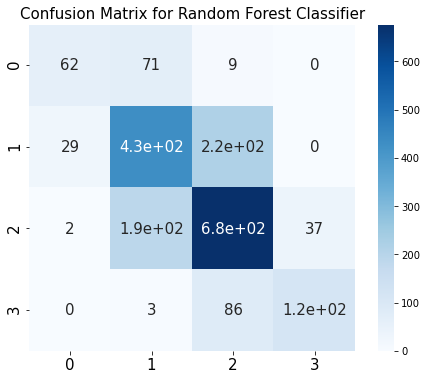

In [31]:
rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)
y_pred_rfc = rfc.predict(x_test)
acc_rfc = rfc.score(x_test, y_test)
print('The accuracy of the Random Forest Classifier is:', acc_rfc * 100, '%')
generate_results(rfc, y_pred_rfc, 'Random Forest Classifier')

## Model ComplementNB

The accuracy of the  ComplementNB is: 50.0 %

The classification report for ComplementNB is:
              precision    recall  f1-score   support

           1       0.47      0.11      0.17       142
           2       0.53      0.75      0.62       677
           3       0.65      0.28      0.39       906
           4       0.35      0.92      0.50       207

    accuracy                           0.50      1932
   macro avg       0.50      0.51      0.42      1932
weighted avg       0.56      0.50      0.47      1932



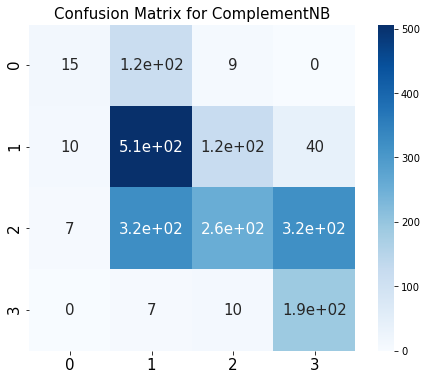

In [32]:
clf = ComplementNB()
clf.fit(x, y)
y_pred_cnb = clf.predict(x_test)
acc_clf = clf.score(x_test, y_test)
print('The accuracy of the  ComplementNB is:', acc_clf * 100, '%')
generate_results(rfc, y_pred_cnb, 'ComplementNB')

##  SGDClassifier

The accuracy of the  SGDClassifier is: 57.091097308488614 %

The classification report for SGDClassifier is:
              precision    recall  f1-score   support

           1       0.87      0.09      0.17       142
           2       0.52      0.51      0.51       677
           3       0.58      0.72      0.64       906
           4       0.75      0.43      0.55       207

    accuracy                           0.57      1932
   macro avg       0.68      0.44      0.47      1932
weighted avg       0.60      0.57      0.55      1932



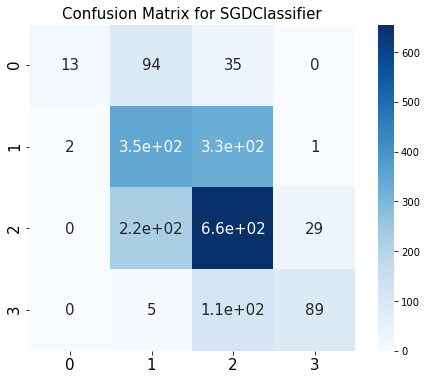

0.7769492758448475

In [33]:
lr = SGDClassifier(loss='hinge',class_weight='balanced')
clf1 =lr.fit(x, y)
calibrator = CalibratedClassifierCV(clf1, cv='prefit')
model=calibrator.fit(x, y)
# Always scale the input. The most convenient way is to use a pipeline.
y_pred_sgd = model.predict(x_test)
acc_clf = model.score(x_test, y_test)
print('The accuracy of the  SGDClassifier is:', acc_clf * 100, '%')
generate_results(rfc, y_pred_sgd, 'SGDClassifier')
roc_auc_score(y, model.predict_proba(x), average='macro',multi_class='ovr')

## PassiveAggressiveClassifier

In [34]:
# Creating model
model_passagg = PassiveAggressiveClassifier(C = 0.5, random_state = 5)
# Fitting model
model_passagg.fit(x_train, y_train)
# Making prediction on test set
y_pred_pag = model_passagg.predict(x_test)
# Model evaluation
print(f"Test Set Accuracy : {accuracy_score(y_test, y_pred_pag) * 100} %\n\n")
print(f"Classification Report : \n\n{classification_report(y_test, y_pred_pag,zero_division=1)}")

Test Set Accuracy : 21.790890269151138 %


Classification Report : 

              precision    recall  f1-score   support

           1       0.16      0.94      0.27       142
           2       0.39      0.09      0.14       677
           3       0.67      0.04      0.07       906
           4       0.22      0.93      0.35       207

    accuracy                           0.22      1932
   macro avg       0.36      0.50      0.21      1932
weighted avg       0.49      0.22      0.14      1932



# Gradient Boosting Classifier


Confusion Matrix:
 [[ 59  73  10   0]
 [ 27 415 234   1]
 [  3 161 697  45]
 [  0   3  75 129]]
Accuracy: 67.0 %
Precision Score: 67.0 %
Recall Score: 67.0 %
F1 Score: 67.0 %

The classification report for Gradient Boosting Classifier is:
              precision    recall  f1-score   support

           1       0.66      0.42      0.51       142
           2       0.64      0.61      0.62       677
           3       0.69      0.77      0.73       906
           4       0.74      0.62      0.68       207

    accuracy                           0.67      1932
   macro avg       0.68      0.61      0.63      1932
weighted avg       0.67      0.67      0.67      1932



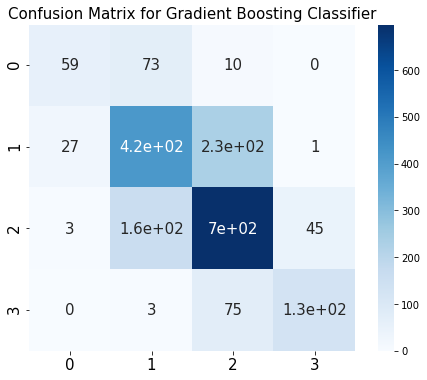

In [35]:
from sklearn import datasets
from sklearn import metrics
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
model = GradientBoostingClassifier()
model.fit(x_train, y_train)
y_pred_gbc = model.predict(x_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_gbc))
print("Accuracy:", round(accuracy_score(y_test, y_pred_gbc),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_gbc, average="weighted"), 2)*100,"%")
generate_results(model, y_pred_gbc, 'Gradient Boosting Classifier')

# Bagging Classifier

Confusion Matrix:
 [[ 58  75   9   0]
 [ 28 432 217   0]
 [  2 190 675  39]
 [  0   3  88 116]]
Accuracy: 66.0 %
Precision Score: 66.0 %
Recall Score: 66.0 %
F1 Score: 66.0 %

The classification report for Bagging Classifier is:
              precision    recall  f1-score   support

           1       0.66      0.41      0.50       142
           2       0.62      0.64      0.63       677
           3       0.68      0.75      0.71       906
           4       0.75      0.56      0.64       207

    accuracy                           0.66      1932
   macro avg       0.68      0.59      0.62      1932
weighted avg       0.66      0.66      0.66      1932



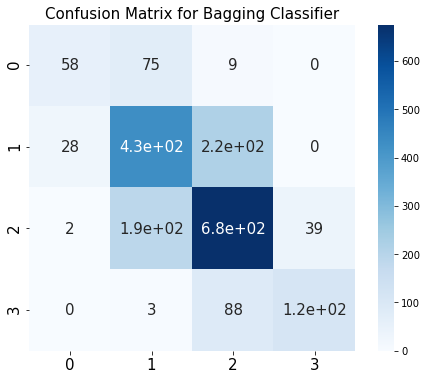

In [36]:
from sklearn.tree import DecisionTreeClassifier , plot_tree
from sklearn.ensemble import BaggingClassifier
bag_model = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=600, max_samples=0.8,
bootstrap=True,oob_score=True,random_state=0)
bag_model.fit(x_train, y_train)
bag_model.oob_score_
bag_model.score(x_test, y_test)
y_pred_bg = bag_model.predict(x_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_bg))
print("Accuracy:", round(accuracy_score(y_test, y_pred_bg),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_bg, average="weighted"), 2)*100,"%")
generate_results(bag_model, y_pred_bg, 'Bagging Classifier')

# Testing

In [37]:
test_x_1 = airbnb_dummies.loc[[21]]
test_x_1.drop('price_group', axis = 1, inplace = True)

In [38]:
airbnb.loc[[21]]

,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Accommodation_Type,Final_Arrondissement,price_group
21,Charmant studio avec terrasse,48.88109,2.3465,2,90,Entire Place,9,2


In [39]:
airbnb_dummies.columns

Index(['Numer_of_Guests', 'Final_Arrondissement', 'price_group',
       'Accommodation_Type_Entire Place', 'Accommodation_Type_Hotel Rooms',
       'Accommodation_Type_Private Rooms', 'Accommodation_Type_Shared Rooms'],
      dtype='object')

In [40]:
#285 - 350 eur/night
cosy = pd.DataFrame({'Numer_of_Guests':4, 'Final_Arrondissement': 18,
       'Accommodation_Type_Entire Place':1, 'Accommodation_Type_Hotel Rooms':0,
       'Accommodation_Type_Private Rooms':0, 'Accommodation_Type_Shared Rooms':0}, index=[0])

In [41]:
cosy

,Numer_of_Guests,Final_Arrondissement,Accommodation_Type_Entire Place,Accommodation_Type_Hotel Rooms,Accommodation_Type_Private Rooms,Accommodation_Type_Shared Rooms
0,4,18,1,0,0,0


In [42]:
#Price 550 EUR/night
jaccuzi = pd.DataFrame({'Numer_of_Guests':7,'Final_Arrondissement': 15,
       'Accommodation_Type_Entire Place':1, 'Accommodation_Type_Hotel Rooms':0,
       'Accommodation_Type_Private Rooms':0, 'Accommodation_Type_Shared Rooms':0}, index=[0])

In [43]:
#Create a function to return the prediction results for 5 models:
def generate_result_table(df):
    result = pd.DataFrame({'Rfc' : rfc.predict(df), 'Clf': clf.predict(df), 'Passive_Aggressive': model_passagg.predict(df), 'SGD Classifier': model.predict(df),'Gradient Boosting':model.predict(df),'Bagging Classifier':bag_model.predict(df)})
    price_group = pd.DataFrame({"1":"< 50 EUR", "2":"< 100 EUR","3":"< 300 EUR","4":"Over 3O0 EUR"},index=[0])
    print(price_group)
    return result


In [44]:
generate_result_table(jaccuzi)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier
0,4,4,4,3,3,4


In [45]:
generate_result_table(cosy)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier
0,3,2,4,3,3,3


In [46]:
generate_result_table(test_x_1)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier
0,2,2,1,3,3,2


In [47]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

print('RandomForestClassifier')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_rfc))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_rfc).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_rfc, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_rfc,average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_rfc, average="macro").round(4)}')
print('\n')


print('SGDCClassifier')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_sgd))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_sgd).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_sgd, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_sgd, average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_sgd, average="macro").round(4)}')
print('\n')


print('ComplementNB')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_cnb))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_cnb).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_cnb, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_cnb, average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_cnb, average="macro").round(4)}')
print('\n')


print('PassiveAggressiveClassifier')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_pag))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_pag).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_pag, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_pag, average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_pag, average="macro").round(4)}')
print('\n')

print('Gradient Boosting Classifier')
print('====================')
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_gbc))
print("Accuracy:", round(accuracy_score(y_test, y_pred_gbc),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_gbc, average="weighted"), 2)*100,"%")
print('\n')

print('Bagging Classifier')
print('====================')
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_bg))
print("Accuracy:", round(accuracy_score(y_test, y_pred_bg),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_bg, average="weighted"), 2)*100,"%")


RandomForestClassifier
Confusion matrix
[[ 62  71   9   0]
 [ 29 431 217   0]
 [  2 191 676  37]
 [  0   3  86 118]]
-------------------
Accuracy = 0.6661
Precision = 0.6829
Recall = 0.5974
F1 score = 0.6303


SGDCClassifier
Confusion matrix
[[ 13  94  35   0]
 [  2 346 328   1]
 [  0 222 655  29]
 [  0   5 113  89]]
-------------------
Accuracy = 0.5709
Precision = 0.6781
Recall = 0.4389
F1 score = 0.4674


ComplementNB
Confusion matrix
[[ 15 118   9   0]
 [ 10 506 121  40]
 [  7 324 255 320]
 [  0   7  10 190]]
-------------------
Accuracy = 0.5
Precision = 0.4974
Recall = 0.5131
F1 score = 0.4216


PassiveAggressiveClassifier
Confusion matrix
[[134   6   0   2]
 [473  60   9 135]
 [221  85  34 566]
 [  5   1   8 193]]
-------------------
Accuracy = 0.2179
Precision = 0.3594
Recall = 0.5005
F1 score = 0.2102


Gradient Boosting Classifier
Confusion Matrix:
 [[ 59  73  10   0]
 [ 27 415 234   1]
 [  3 161 697  45]
 [  0   3  75 129]]
Accuracy: 67.0 %
Precision Score: 67.0 %
Recall Sco

In [48]:
from tpot import TPOTClassifier
from sklearn.datasets import load_digits

tpot = TPOTClassifier(generations=5, population_size=50, verbosity=2)
tpot.fit(x_train, y_train)
print(tpot.score(x_test, y_test))
tpot.export('tpot_digits_pipeline.py')

C:\Users\gixi_\anaconda3\lib\site-packages\tpot\builtins\__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.6598938276876959

Generation 2 - Current best internal CV score: 0.6598938276876959

Generation 3 - Current best internal CV score: 0.6611879074090355

Generation 4 - Current best internal CV score: 0.6611879074090355

Generation 5 - Current best internal CV score: 0.6623531234169399

Best pipeline: RandomForestClassifier(MinMaxScaler(input_matrix), bootstrap=True, criterion=gini, max_features=0.55, min_samples_leaf=7, min_samples_split=2, n_estimators=100)
0.6656314699792961
